# Multi-class fine-grained Image clasification 

In this case study we will focus on **fine-grained** image classification, i.e. we will classify **sub-classes** within a **higher-level** class.

We will use the **Stanford Dogs** dataset, keeping **10,222** labeled images(out of 20,580) of **120** different dog breeds, our task will be to build a *fine-grained 120-class classification* model.

# Loading and exploring the Stanford dogs dataset 

In [1]:
import skimage.transform as tf
import numpy as np
import pandas as pd
import PIL
import scipy.ndimage as spi
import matplotlib.pyplot as plt
from itertools import cycle
from pathlib import Path

%matplotlib inline

#np.random.seed(52)

C:\Users\EduardoCastillo\Anaconda3\envs\py35TrainableBN\lib\site-packages\skimage\transform\_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "


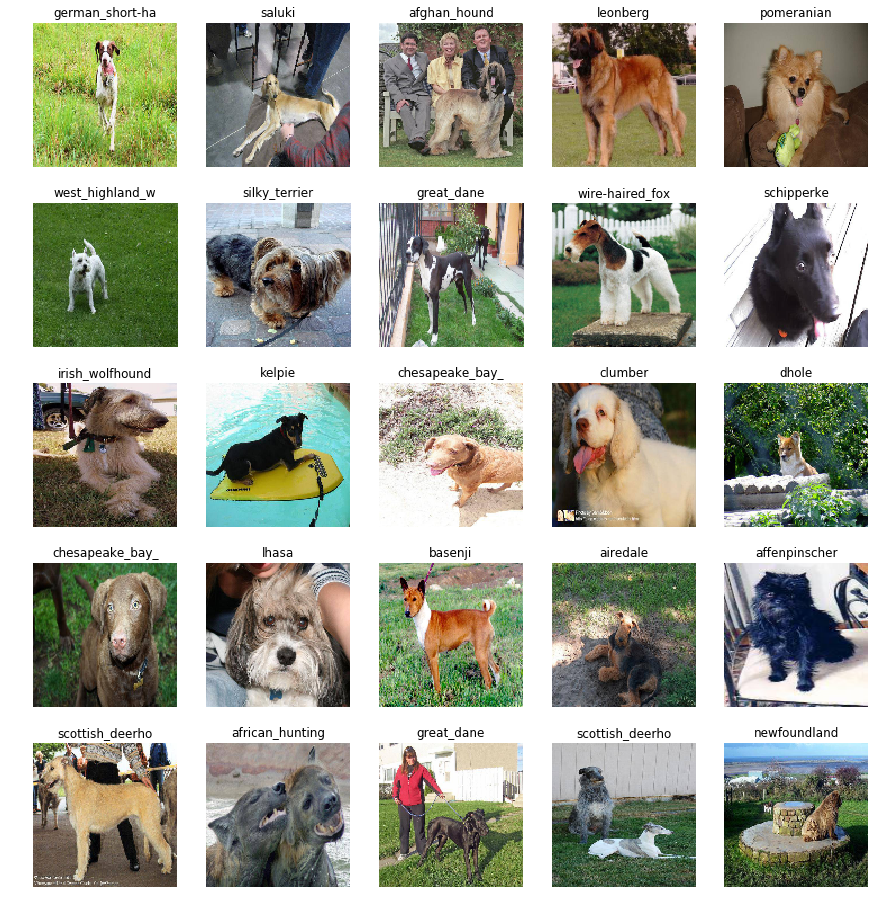

In [7]:
DATASET_PATH = Path("DogsBreedsData/train")
LABELS_PATH = Path("DogsBreedsData/labels.csv")

# This function a random batch form the dataset


def load_batch(labels_df, batch_size=25):
    batch_df = labels_df.loc[np.random.permutation(np.arange(0, len(labels_df)))[:batch_size], :]
    return batch_df

# This function plots sample images with an specific size and in defined grid


def plot_batch(batch_labels_df, grid_width, grid_height, im_scale_x, im_scale_y):
    f, ax = plt.subplots(grid_width, grid_height)
    f.set_size_inches(12, 12)

    img_idx = 0

    for i in range(0, grid_width):
        for j in range(0, grid_height):
            ax[i][j].axis('off')
            ax[i][j].set_title(batch_labels_df.iloc[img_idx]['breed'][:15])
            ax[i][j].imshow(tf.resize(plt.imread(
                DATASET_PATH / (batch_labels_df.iloc[img_idx]['id'] + '.jpg')), (im_scale_x, im_scale_y)))

            img_idx += 1
                        
    plt.subplots_adjust(left=0,bottom=0,right=1,top=1,wspace=0,hspace=0.25)
    
#lets now call the above fuctions

labels_df=pd.read_csv(LABELS_PATH)
batch_df= load_batch(labels_df)
plot_batch(batch_df,grid_width=5, grid_height=5,im_scale_x=128, im_scale_y=128)

We can **see** from the batch above that there is a **lot of variations** on the images, different resolution, zoom levels, lighting, etc. Also we can see images with **more than one dog** , we learned from the previus binary-classification exercise that these are a significant  **challenge** for the model. 

# Building Datasets

In [2]:
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import img_to_array, load_img , array_to_img
from keras.preprocessing.image import ImageDataGenerator

C:\Users\EduardoCastillo\Anaconda3\envs\py35TrainableBN\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


In [8]:
target_labels = labels_df['breed']

print("There is {} different classes on the labels".format(len(set(target_labels))))
labels_df.head()

There is 120 different classes on the labels


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


We will create a **new column** in the **labels_df** with the exact path to our disk, so we can load and use the images easily in the future.

In [9]:
train_folder = 'DogsBreedsData/train/'

labels_df['image_path'] = labels_df.apply(
    lambda row: (train_folder + row["id"] + ".jpg"), axis=1)

labels_df.head()

,id,breed,image_path
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull,DogsBreedsData/train/000bec180eb18c7604dcecc8f...
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo,DogsBreedsData/train/001513dfcb2ffafc82cccf4d8...
2,001cdf01b096e06d78e9e5112d419397,pekinese,DogsBreedsData/train/001cdf01b096e06d78e9e5112...
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick,DogsBreedsData/train/00214f311d5d2247d5dfe4fe2...
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever,DogsBreedsData/train/0021f9ceb3235effd7fcde7f7...


Lets now **split** the data for train, validation and test

In [6]:
# load all images
all_data = np.array([img_to_array(load_img(img, target_size=(299, 299)))
                     for img in labels_df['image_path'].values.tolist()]).astype('float32')

# Create train and test sets
x_train, x_test, y_train, y_test = train_test_split(
    all_data, target_labels, test_size=0.3, stratify=np.array(target_labels), random_state=52)

# create train and validation sets

x_train, x_val, y_train, y_val = train_test_split(
    x_train, y_train, test_size=0.15, stratify=np.array(y_train), random_state=52)

print('Initial Dataset Size:', train_data.shape)
print('Train, Test and Validation Datasets Size:', x_train.shape, x_test.shape, x_val.shape)

NameError: name 'train_data' is not defined

In [8]:
# I made a mistake above with the name of the array containing all images, I will only print again
# because I do not want to run all the spliting process one more time.
print('Initial Dataset Size:', all_data.shape)
print('Train, Test and Validation Datasets Size:',
      x_train.shape, x_test.shape, x_val.shape)

Initial Dataset Size: (10222, 299, 299, 3)
Train, Test and Validation Datasets Size: (6081, 299, 299, 3) (3067, 299, 299, 3) (1074, 299, 299, 3)


Lets now **save** the datasets on our disk since making the stratifyed random split of set takes some **time and a lot of RAM**

In [17]:
np.save("Dog_breeds_train_data", x_train)
np.save("Dog_breeds_val_data", x_val)
np.save("Dog_breeds_test_data", x_test)

We will now **convert** the **target labels** from **text** classes to **dummy** classes

In [18]:
y_train_dummies = pd.get_dummies(y_train.reset_index(drop=True)).as_matrix()
y_val_dummies = pd.get_dummies(y_val.reset_index(drop=True)).as_matrix()
y_test_dummies = pd.get_dummies(y_test.reset_index(drop=True)).as_matrix()

C:\Users\EduardoCastillo\Anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """Entry point for launching an IPython kernel.
C:\Users\EduardoCastillo\Anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:2: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
C:\Users\EduardoCastillo\Anaconda3\envs\py35\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  This is separate from the ipykernel package so we can avoid doing imports until


Lets now also **save the labels** in dummy format to our disk for future usage.

In [21]:
np.save("Dog_breeds_train_labels", y_train_dummies)
np.save("Dog_breeds_val_labels", y_val_dummies)
np.save("Dog_breeds_test_labels", y_test_dummies)

## Load up  datasets and labels from disk.  
Lets now load up the numpy darray containing the datasets and the labels

In [3]:
x_train = np.load("Dog_breeds_train_data.npy")
x_val = np.load("Dog_breeds_val_data.npy")
x_test = np.load("Dog_breeds_test_data.npy")

y_train_dummies = np.load("Dog_breeds_train_labels.npy")
y_val_dummies = np.load("Dog_breeds_val_labels.npy")
y_test_dummies = np.load("Dog_breeds_test_labels.npy")

# Image Augmentation

We have a total of **10,222 images**, containing **120 classes** , i.e. we have in average **85** images **per class** only. By our previus experience we know there is a huge chance that the model will **overfit** on the training data due to the **small** amount of **data**.

That is why we will use image augmentation leveraging the kera's utily called **ImageDataGenerator**

In [4]:
BATCH_SIZE = 32

# create train generator

train_datagen = ImageDataGenerator(rescale=1./255, rotation_range=30,
                                   width_shift_range=0.2, height_shift_range=0.2, horizontal_flip=True)

train_generator = train_datagen.flow(
    x_train, y_train_dummies, shuffle=False, batch_size=BATCH_SIZE, seed=1)

# create validation generator

val_datagen = ImageDataGenerator(rescale=1./255)
val_generator = val_datagen.flow(x_val, y_val_dummies, shuffle=False, batch_size=BATCH_SIZE, seed=1)

Labels: ['black-and-tan_coonhound', 'black-and-tan_coonhound', 'black-and-tan_coonhound', 'black-and-tan_coonhound', 'black-and-tan_coonhound']


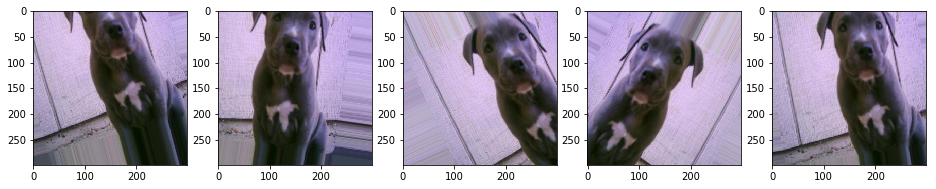

In [30]:
# lets see how these generated images would look.

y_train = np.array(labels_df['breed'])

img_id = 28
sample_generator = train_datagen.flow(x_train[img_id:img_id+1], y_train[img_id:img_id+1],
                                      batch_size=1)
sample = [next(sample_generator) for i in range(0, 5)]
fig, ax = plt.subplots(1, 5, figsize=(16, 6))
print('Labels:', [item[1][0] for item in sample])
l = [ax[i].imshow(sample[i][0][0]) for i in range(0, 5)]

# Building the model

We will be using the **Inception V3** model from google as our **pre-trained** model, we will use it as **feature extractor**, remove the last layers of the model and add our own **fully connected** layers and **softmax** final layer to classifying the 120 breeds.

In [4]:
from keras import Model
from keras.optimizers import Adam
from keras.layers import GlobalAveragePooling2D
from keras.layers import Dense
from keras.applications.inception_v3 import InceptionV3
from keras.utils.np_utils import to_categorical

In [10]:
# instanciate the inception V3 model so we can transfer its knowledge

base_inception = InceptionV3(
    weights='imagenet', include_top=False, input_shape=(299, 299, 3))

# Add global spatial average pooling layer, 2 dense layers and the final Dense-softmax layer

out = base_inception.output
out = GlobalAveragePooling2D()(out)
out = Dense(512, activation='relu')(out)
out = Dense(512, activation='relu')(out)
total_classes = y_train_dummies.shape[1]
predictions = Dense(total_classes, activation='softmax')(out)

model = Model(inputs=base_inception.input, outputs=predictions)

# lets now freeze the the V3 model layers so they do not adjust their weights

for layer in base_inception.layers:
    layer.trainable = False

# Compailing the model

model.compile(Adam(lr=0.0001), loss='categorical_crossentropy',
              metrics=['accuracy'])
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 299, 299, 3)  0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 149, 149, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 149, 149, 32) 96          conv2d_1[0][0]                   
__________________________________________________________________________________________________
activation_1 (Activation)       (None, 149, 149, 32) 0           batch_normalization_1[0][0]      
__________________________________________________________________________________________________
conv2d_2 (

Lets now **train** the model using **fit_generator()** that will leverage the *image augmentation - data generator* from above.
We will use **32** as **BATCH_SIZE** and train the model through **number** epochs.

Epoch 1/20
190/190 [==============================] - 6076s 32s/step - loss: 4.1405 - acc: 0.2118 - val_loss: 2.6058 - val_acc: 0.6383
Epoch 2/20
190/190 [==============================] - 5301s 28s/step - loss: 2.1861 - acc: 0.5684 - val_loss: 0.9631 - val_acc: 0.7994
Epoch 3/20
190/190 [==============================] - 5473s 29s/step - loss: 1.3907 - acc: 0.6707 - val_loss: 0.6473 - val_acc: 0.8253
Epoch 4/20
190/190 [==============================] - 5884s 31s/step - loss: 1.1303 - acc: 0.7112 - val_loss: 0.5301 - val_acc: 0.8445
Epoch 5/20
190/190 [==============================] - 5262s 28s/step - loss: 1.0142 - acc: 0.7309 - val_loss: 0.4648 - val_acc: 0.8551
Epoch 6/20
190/190 [==============================] - 5279s 28s/step - loss: 0.9337 - acc: 0.7462 - val_loss: 0.4653 - val_acc: 0.8532
Epoch 7/20
190/190 [==============================] - 5276s 28s/step - loss: 0.8611 - acc: 0.7676 - val_loss: 0.4386 - val_acc: 0.8570
Epoch 8/20
190/190 [==============================] - 5

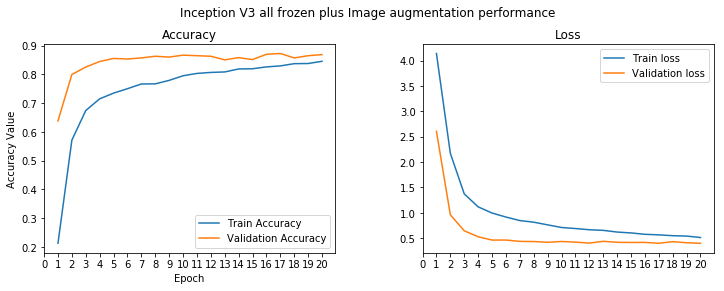

In [11]:
batch_size = BATCH_SIZE
train_steps_per_epoch = x_train.shape[0]//batch_size
val_steps_per_epoch = x_val.shape[0]//batch_size

history = model.fit_generator(train_generator, steps_per_epoch=train_steps_per_epoch, validation_data= val_generator,
                              validation_steps=val_steps_per_epoch, epochs=20, verbose=1)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
t = f.suptitle(
    'Inception V3 all frozen plus Image augmentation performance', fontsize=12)
f.subplots_adjust(top=0.85, wspace=0.3)

epoch_list = list(range(1, 21))
ax1.plot(
    epoch_list, history.history['acc'], label='Train Accuracy')
ax1.plot(epoch_list,
         history.history['val_acc'], label='Validation Accuracy')
ax1.set_xticks(np.arange(0, 21, 1))
ax1.set_ylabel('Accuracy Value')
ax1.set_xlabel('Epoch')
ax1.set_title('Accuracy')
l1 = ax1.legend(loc="best")

ax2.plot(epoch_list, history.history['loss'], label='Train loss')
ax2.plot(
    epoch_list, history.history['val_loss'], label='Validation loss')
ax2.set_xticks(np.arange(0, 21, 1))
ax2.set_ylabel = ('Loss Value')
ax2.set_xlabel = ('Epoch')
ax2.set_title('Loss')
l2 = ax2.legend(loc="best")

model.save('multiclassDogsBreedsInceptionV3.h5')

# Evaluating the model on the Test Dataset.

While evaluating **unseen data** we have to be careful about **pre-processing** the test dataset in a **similar way** to the training data.  
Remember that we **scale the data** *(x/255)* in the **training dataset** so we will do the same scaling to the **test dataset**


In [7]:
from keras.models import load_model
import model_evaluation_utils as meu

# loading  te model from disk

model = load_model('multiclassDogsBreedsInceptionV3.h5')

# scaling the test dataset
x_test /= 255.

# getting the predictions for the test data

test_predictions = model.predict(x_test)

In [140]:
# saving the test_predictions in disk, for further use

np.save("Dog_breeds_test_predictions", test_predictions)

These are some series,arrays and dictionaries that will be **used** for the **visualization** of results.

In [85]:
all_labels_dummies = pd.get_dummies(target_labels, sparse=True)
all_labels_dummies_np = np.asarray(all_labels_dummies)
labels_dict = dict(enumerate(all_labels_dummies.columns.values))

In [87]:
# 120 lenght vector for each data point, containing probabilities
predictions = pd.DataFrame(
    test_predictions, columns=all_labels_dummies.columns)

# "t1" stands for Top-1(only the class with max probability)
predictions_t1 = list(predictions.idxmax(axis=1))

# Get categorcial test labels back from the dummies

y_test = pd.DataFrame(y_test_dummies).idxmax(axis=1)
y_test = list(y_test.replace(labels_dict))

# getting the metrics for the test dataset
meu.get_metrics(true_labels=y_test, predicted_labels=predictions_t1)

Accuracy: 0.8676
Precision: 0.8722
Recall: 0.8676
F1 Score: 0.8646


We will also show the **classification report** so we can see the **per-class** metrics 

In [88]:
meu.display_classification_report(
    true_labels=y_test, predicted_labels=predictions_t1, classes=list(all_labels_dummies.columns))

                                precision    recall  f1-score   support

                 affenpinscher       0.96      0.92      0.94        24
                  afghan_hound       1.00      1.00      1.00        35
           african_hunting_dog       0.96      0.96      0.96        26
                      airedale       0.86      0.94      0.90        32
american_staffordshire_terrier       0.88      0.68      0.77        22
                   appenzeller       0.60      0.65      0.63        23
            australian_terrier       0.64      0.87      0.74        31
                       basenji       0.83      0.91      0.87        33
                        basset       1.00      0.96      0.98        25
                        beagle       0.81      0.94      0.87        31
            bedlington_terrier       1.00      1.00      1.00        27
          bernese_mountain_dog       0.94      0.91      0.93        34
       black-and-tan_coonhound       0.95      0.78      0.86  

 we can see that in general breeds with **particular physical characteristics** are **better classified** , while other breeds that have some **similar breeds** e.g. **Malamute, siberian husky , eskimo** are **difficult to classify**. 

## visualizing  model predictions

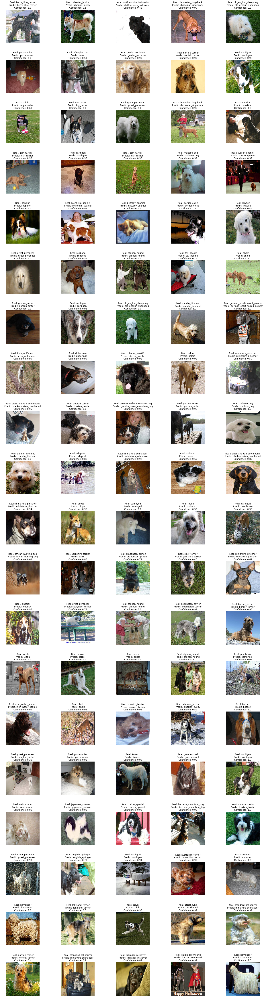

In [141]:
grid_width = 20
grid_weight = 5
f, ax = plt.subplots(grid_width, grid_weight)
f.set_size_inches(20, 25, forward=True)
batch_size = 100
dataset = x_test

# the 'at(0)' means the shape at node 0, in this case we only have 1 node
model_input_shape = (1,)+model.get_input_shape_at(0)[1:]

random_batch_indx = np.random.permutation(
    np.arange(0, len(dataset)))[:batch_size]

img_idx = 0
for i in range(0, grid_width):
    for j in range(0, grid_weight):
        actual_label = np.asarray(y_test)[random_batch_indx[img_idx]]
        prediction = model.predict(
            dataset[random_batch_indx[img_idx]].reshape(model_input_shape))[0]
        label_idx = np.argmax(prediction)
        predicted_label = label_dict.get(label_idx)
        conf = round(prediction[label_idx], 2)

        ax[i][j].axis('off')
        ax[i][j].set_title('Real: ' + actual_label + '\nPredic: ' +
                           predicted_label + '\nProbability: ' + str(conf))
        ax[i][j].imshow(dataset[random_batch_indx[img_idx]])
        img_idx += 1

plt.subplots_adjust(left=0, bottom=0, right=1, top=3, wspace=0.3, hspace=0.5)

# Fine-tuning the Inception V3 model.  

We will **try** to **fine-tune** the inception V3 model, being aware that there is a **obstacle** due to the way **batch normalization** is implemented in **keras** .

Simplifying, the problem is that while **training** the model, in the **batch normalization layers** the batch **statistics(mean and variance)** are used, this means that **even if** we **froze** the **batch normalization layers** keras will use the **new training data** to calculate the mean and variance for the normalization, the **obstacle** comes when we try to **predict** the **test data**, while **predicting** keras will use the **statistics** that learned in the **original training** of the inception V3 model.

This **difference** in the **scales** between the training and inference mode will **affect accuracy** on the test and validation datasets (inference mode). For more information visit the following link:

http://blog.datumbox.com/the-batch-normalization-layer-of-keras-is-broken/

According to Keras documentation in order to **fine-tune** the incetion V3 model we should **first train our top layers**, i.e. we should **freeze all convolutional Inception V3 blocks** , we have **already done this** so we will **import the trained model from disk**.  

https://keras.io/applications/#usage-examples-for-image-classification-models

In [7]:
from keras.models import load_model

# loading  te model from disk

model = load_model('multiclassDogsBreedsInceptionV3.h5')

We will now **show all convolutional layers** so we can decide which layers will be **unfrozen** 

In [6]:
for i, layer in enumerate(base_inception.layers):
    print(i, layer.name)

0 input_1
1 conv2d_1
2 batch_normalization_1
3 activation_1
4 conv2d_2
5 batch_normalization_2
6 activation_2
7 conv2d_3
8 batch_normalization_3
9 activation_3
10 max_pooling2d_1
11 conv2d_4
12 batch_normalization_4
13 activation_4
14 conv2d_5
15 batch_normalization_5
16 activation_5
17 max_pooling2d_2
18 conv2d_9
19 batch_normalization_9
20 activation_9
21 conv2d_7
22 conv2d_10
23 batch_normalization_7
24 batch_normalization_10
25 activation_7
26 activation_10
27 average_pooling2d_1
28 conv2d_6
29 conv2d_8
30 conv2d_11
31 conv2d_12
32 batch_normalization_6
33 batch_normalization_8
34 batch_normalization_11
35 batch_normalization_12
36 activation_6
37 activation_8
38 activation_11
39 activation_12
40 mixed0
41 conv2d_16
42 batch_normalization_16
43 activation_16
44 conv2d_14
45 conv2d_17
46 batch_normalization_14
47 batch_normalization_17
48 activation_14
49 activation_17
50 average_pooling2d_2
51 conv2d_13
52 conv2d_15
53 conv2d_18
54 conv2d_19
55 batch_normalization_13
56 batch_norma

At this point the **top layers** are **well-trained over 20 epochs** and we can start fine-tuning. We will now **unfreeze** the **top 2 inception V3 convolutional blocks** and train them on the Stanford dogs dataset.

In [9]:
for layer in model.layers[:249]:
    layer.trainable = False
for layer in model.layers[249:]:
    layer.trainable = True
    
#we now have to re-compile the model so the modifications can take effect 
model.compile(Adam(lr=0.0001), loss='categorical_crossentropy',
              metrics=['accuracy'])
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 299, 299, 3)  0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 149, 149, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 149, 149, 32) 96          conv2d_1[0][0]                   
__________________________________________________________________________________________________
activation_1 (Activation)       (None, 149, 149, 32) 0           batch_normalization_1[0][0]      
__________________________________________________________________________________________________
conv2d_2 (

We can see that when all convolutional blocks are frozen there is **1,373,304** trainable parameters, now that we have **unfreeze** 2 convolutional blocks there is **12,488,184** trainable parameters, it will defenetely take longer to re-train the model but we **might get an improvement** if the batch normalization obstacle has already been fixed in keras.

Epoch 1/15
190/190 [==============================] - 5931s 31s/step - loss: 0.6642 - acc: 0.7937 - val_loss: 0.5287 - val_acc: 0.8267
Epoch 2/15
190/190 [==============================] - 6006s 32s/step - loss: 0.4125 - acc: 0.8778 - val_loss: 0.5965 - val_acc: 0.8109
Epoch 3/15
190/190 [==============================] - 5949s 31s/step - loss: 0.2972 - acc: 0.9061 - val_loss: 0.6105 - val_acc: 0.8138
Epoch 4/15
190/190 [==============================] - 5951s 31s/step - loss: 0.2018 - acc: 0.9413 - val_loss: 0.6125 - val_acc: 0.8061
Epoch 5/15
190/190 [==============================] - 5947s 31s/step - loss: 0.1542 - acc: 0.9553 - val_loss: 0.5966 - val_acc: 0.8148
Epoch 6/15
190/190 [==============================] - 5957s 31s/step - loss: 0.1403 - acc: 0.9592 - val_loss: 0.7119 - val_acc: 0.7927
Epoch 7/15
190/190 [==============================] - 5952s 31s/step - loss: 0.1254 - acc: 0.9653 - val_loss: 0.6724 - val_acc: 0.8033
Epoch 8/15
190/190 [==============================] - 5

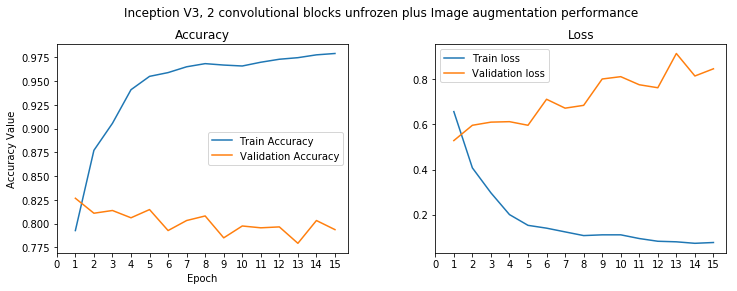

In [12]:
batch_size = BATCH_SIZE
train_steps_per_epoch = x_train.shape[0]//batch_size
val_steps_per_epoch = x_val.shape[0]//batch_size

history = model.fit_generator(train_generator, steps_per_epoch=train_steps_per_epoch, validation_data=val_generator,
                              validation_steps=val_steps_per_epoch, epochs=15, verbose=1)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
t = f.suptitle(
    'Inception V3, 2 convolutional blocks unfrozen plus Image augmentation performance', fontsize=12)
f.subplots_adjust(top=0.85, wspace=0.3)

epoch_list = list(range(1, 16))
ax1.plot(
    epoch_list, history.history['acc'], label='Train Accuracy')
ax1.plot(epoch_list,
         history.history['val_acc'], label='Validation Accuracy')
ax1.set_xticks(np.arange(0, 16, 1))
ax1.set_ylabel('Accuracy Value')
ax1.set_xlabel('Epoch')
ax1.set_title('Accuracy')
l1 = ax1.legend(loc="best")

ax2.plot(epoch_list, history.history['loss'], label='Train loss')
ax2.plot(
    epoch_list, history.history['val_loss'], label='Validation loss')
ax2.set_xticks(np.arange(0, 16, 1))
ax2.set_ylabel = ('Loss Value')
ax2.set_xlabel = ('Epoch')
ax2.set_title('Loss')
l2 = ax2.legend(loc="best")

model.save('multiclassDogsBreedsInceptionV3FineTune.h5')

We can see in the graphs above that, **the obstacle** to properly **fine-tune** models with batch normalization such as Inception V3 model, is **still there**, Looking at the **training line** we can appreciate that by fine-tunig the last 2 convolutional blocks, the model is able to get a **higher accuracy in training mode**, the struggle could be coming from different scales in the normalization of data in the **inference mode** (prediction).  

## Fine-tuning the model with batch normalization patch.  

We will try to fin-tune the Inception V3 model using an **alternative branch** of the keras **git repository**, this branch was created by **datumbox** and is meant to use **batch normalization properly** while fine-tuning a deep learning model.

For more info visit:  
https://github.com/datumbox/keras/tree/bugfix/trainable_bn  
https://github.com/keras-team/keras/pull/9965

It is important to mention that the branch we will use **was not merged** to the master branch of the keras repository due to conflicts in the **semantics of the trainable property.**

This part of the **notebook** was ran using another **Anaconda enviroment** that had the keras **patched version** of batch normalization.

In [1]:
from keras.preprocessing.image import img_to_array, load_img , array_to_img
from keras.preprocessing.image import ImageDataGenerator
from keras import Model
from keras.optimizers import Adam
from keras.layers import GlobalAveragePooling2D
from keras.layers import Dense
from keras.applications.inception_v3 import InceptionV3
from keras.utils.np_utils import to_categorical

C:\Users\EduardoCastillo\Anaconda3\envs\py35TrainableBN\lib\site-packages\h5py\__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.


According to Keras documentation in order to **fine-tune** the incetion V3 model we should **first train our top layers**, i.e. we should **freeze all convolutional Inception V3 blocks** , we have **already done this** so we will **import the trained model from disk**.  

https://keras.io/applications/#usage-examples-for-image-classification-models

In [4]:
from keras.models import load_model

# loading  te model from disk

model = load_model('multiclassDogsBreedsInceptionV3.h5')

# instanciate the inception V3 model so we can transfer its knowledge

base_inception = InceptionV3(
    weights='imagenet', include_top=False, input_shape=(299, 299, 3))

for i, layer in enumerate(base_inception.layers):
    print(i, layer.name)

0 input_1
1 conv2d_1
2 batch_normalization_1
3 activation_1
4 conv2d_2
5 batch_normalization_2
6 activation_2
7 conv2d_3
8 batch_normalization_3
9 activation_3
10 max_pooling2d_1
11 conv2d_4
12 batch_normalization_4
13 activation_4
14 conv2d_5
15 batch_normalization_5
16 activation_5
17 max_pooling2d_2
18 conv2d_9
19 batch_normalization_9
20 activation_9
21 conv2d_7
22 conv2d_10
23 batch_normalization_7
24 batch_normalization_10
25 activation_7
26 activation_10
27 average_pooling2d_1
28 conv2d_6
29 conv2d_8
30 conv2d_11
31 conv2d_12
32 batch_normalization_6
33 batch_normalization_8
34 batch_normalization_11
35 batch_normalization_12
36 activation_6
37 activation_8
38 activation_11
39 activation_12
40 mixed0
41 conv2d_16
42 batch_normalization_16
43 activation_16
44 conv2d_14
45 conv2d_17
46 batch_normalization_14
47 batch_normalization_17
48 activation_14
49 activation_17
50 average_pooling2d_2
51 conv2d_13
52 conv2d_15
53 conv2d_18
54 conv2d_19
55 batch_normalization_13
56 batch_norma

At this point the **top layers** are **well-trained over 20 epochs** and we can start fine-tuning. We will now **unfreeze** the **top 2 inception V3 convolutional blocks** and train them on the Stanford dogs dataset.

In [5]:
for layer in model.layers[:249]:
    layer.trainable = False
for layer in model.layers[249:]:
    layer.trainable = True
    
#we now have to re-compile the model so the modifications can take effect 
model.compile(Adam(lr=0.0001), loss='categorical_crossentropy',
              metrics=['accuracy'])
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            (None, 299, 299, 3)  0                                            
__________________________________________________________________________________________________
conv2d_1 (Conv2D)               (None, 149, 149, 32) 864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 149, 149, 32) 96          conv2d_1[0][0]                   
__________________________________________________________________________________________________
activation_1 (Activation)       (None, 149, 149, 32) 0           batch_normalization_1[0][0]      
__________________________________________________________________________________________________
conv2d_2 (

We can see that when all convolutional blocks are frozen there is **1,373,304** trainable parameters, now that we have **unfreeze** 2 convolutional blocks there is **12,488,184** trainable parameters.

Epoch 1/15
190/190 [==============================] - 9259s 49s/step - loss: 0.6661 - acc: 0.7995 - val_loss: 0.5793 - val_acc: 0.8087
Epoch 2/15
190/190 [==============================] - 7278s 38s/step - loss: 0.3945 - acc: 0.8798 - val_loss: 0.5762 - val_acc: 0.8311
Epoch 3/15
190/190 [==============================] - 6951s 37s/step - loss: 0.2885 - acc: 0.9128 - val_loss: 0.6562 - val_acc: 0.8033
Epoch 4/15
190/190 [==============================] - 6924s 36s/step - loss: 0.2186 - acc: 0.9391 - val_loss: 0.6150 - val_acc: 0.8177
Epoch 5/15
190/190 [==============================] - 6931s 36s/step - loss: 0.1700 - acc: 0.9480 - val_loss: 0.6693 - val_acc: 0.8052
Epoch 6/15
190/190 [==============================] - 6928s 36s/step - loss: 0.1503 - acc: 0.9553 - val_loss: 0.6801 - val_acc: 0.8090
Epoch 7/15
190/190 [==============================] - 7228s 38s/step - loss: 0.1208 - acc: 0.9655 - val_loss: 0.6713 - val_acc: 0.8138
Epoch 8/15
190/190 [==============================] - 6

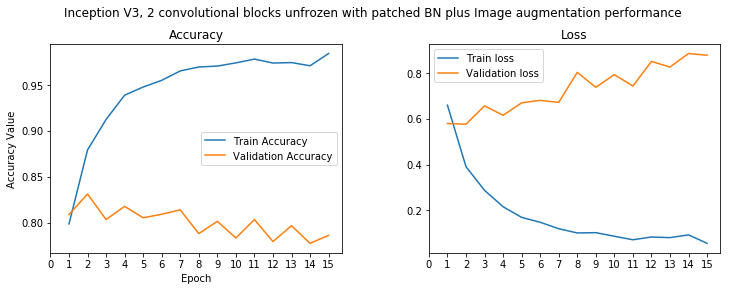

In [9]:
BATCH_SIZE = 32

# create train generator

train_datagen = ImageDataGenerator(rescale=1./255, rotation_range=30,
                                   width_shift_range=0.2, height_shift_range=0.2, horizontal_flip=True)

train_generator = train_datagen.flow(
    x_train, y_train_dummies, shuffle=False, batch_size=BATCH_SIZE, seed=1)

# create validation generator

val_datagen = ImageDataGenerator(rescale=1./255)
val_generator = val_datagen.flow(x_val, y_val_dummies, shuffle=False, batch_size=BATCH_SIZE, seed=1)

# training model 
train_steps_per_epoch = x_train.shape[0]//BATCH_SIZE
val_steps_per_epoch = x_val.shape[0]//BATCH_SIZE

history = model.fit_generator(train_generator, steps_per_epoch=train_steps_per_epoch, validation_data=val_generator,
                              validation_steps=val_steps_per_epoch, epochs=15, verbose=1)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
t = f.suptitle(
    'Inception V3, 2 convolutional blocks unfrozen with patched BN plus Image augmentation performance ', fontsize=12)
f.subplots_adjust(top=0.85, wspace=0.3)

epoch_list = list(range(1, 16))
ax1.plot(
    epoch_list, history.history['acc'], label='Train Accuracy')
ax1.plot(epoch_list,
         history.history['val_acc'], label='Validation Accuracy') 
ax1.set_xticks(np.arange(0, 16, 1))
ax1.set_ylabel('Accuracy Value')
ax1.set_xlabel('Epoch')
ax1.set_title('Accuracy')
l1 = ax1.legend(loc="best")

ax2.plot(epoch_list, history.history['loss'], label='Train loss')
ax2.plot(
    epoch_list, history.history['val_loss'], label='Validation loss')
ax2.set_xticks(np.arange(0, 16, 1))
ax2.set_ylabel = ('Loss Value')
ax2.set_xlabel = ('Epoch')
ax2.set_title('Loss')
l2 = ax2.legend(loc="best")

model.save('multiclassDogsBreedsInceptionV3FineTunePatchBN.h5')

We did **not** get any **improvements**, we are getting **similar results** than the previous model, I have some **hypothesis** of what the problem is:  
1. I did **not correctly** uninstall and **install** the keras patched version.  
2. I **used** the **multiclassDogsBreedsInceptionV3.h5 model** for the top layers training, this model was trained using the **normal version** of keras.
3. Now that we are **fine-tunig 2 convolutional blocks** of the Inception V3 model, we expect the model to have a **bigger learning capability** , so **overfitting** is a posiblity.

One way to know if your model is **being affected** by  batch normalization, is using the **same data** in **training mode** and **inference mode**, we have already try the **train_generator** in the above model, getting a **97-98** accuracy in **training mode**, so now we will **evaluate** the same dataset but in **inference mode.**

In [2]:
from keras.models import load_model

model = load_model('multiclassDogsBreedsInceptionV3FineTunePatchBN.h5')

In [4]:
BATCH_SIZE = 32

# create train generator

train_datagen = ImageDataGenerator(rescale=1./255, rotation_range=30,
                                   width_shift_range=0.2, height_shift_range=0.2, horizontal_flip=True)

train_generator = train_datagen.flow(
    x_train, y_train_dummies, shuffle=False, batch_size=BATCH_SIZE, seed=1)

In [5]:
model.evaluate_generator(train_generator, steps=None, max_queue_size=10, workers=1, use_multiprocessing=False, verbose=1)

191/191 [==============================] - 7095s 37s/step


[0.2178409362083108, 0.9352080249958888]

With **inference mode** (prediction) in the same dataset we are getting about **5 percentage points less** in the accuracy, and about **15 percentage points less** in the loss function, given this result, we **can not discard** either the **first** or **second** hypothesis.  

## Fine-tuning the model with batch normalization patch, 2nd try.  

1. We will uninstall and install the **patched version** of keras once again.
2. This time we will **train** the model from the **beginning**, we will first **freeze** all convolutional blocks and **train only** our top fully connected layers. Then we will **unfreeze** the top 2 convolutional blocks of the Inception V3 model and train again, i.e. we will freeze the first 249 layers and unfreeze the rest.
3. we will also **reduce the learning rate** when we **unfreeze** the 2 **convolutional** blocks, we will do this **due to** the **third hypothesis**, we do **not want to** update the weights of the convolutional blocks **abruptly** to **avoid overfitting**.

In [ ]:
import skimage.transform as tf
import numpy as np
import pandas as pd
import PIL
import scipy.ndimage as spi
import matplotlib.pyplot as plt
from itertools import cycle
from pathlib import Path
from sklearn.model_selection import train_test_split
from keras.preprocessing.image import img_to_array, load_img , array_to_img
from keras.preprocessing.image import ImageDataGenerator

%matplotlib inline

### Load up  datasets and labels from disk.  
Lets now load up the numpy darray containing the datasets and the labels

In [2]:
x_train = np.load("Dog_breeds_train_data.npy")
x_val = np.load("Dog_breeds_val_data.npy")
x_test = np.load("Dog_breeds_test_data.npy")

y_train_dummies = np.load("Dog_breeds_train_labels.npy")
y_val_dummies = np.load("Dog_breeds_val_labels.npy")
y_test_dummies = np.load("Dog_breeds_test_labels.npy")

We will remove the **seed** in the generators

In [3]:
BATCH_SIZE = 32

# create train generator

train_datagen = ImageDataGenerator(rescale=1./255, rotation_range=30,
                                   width_shift_range=0.2, height_shift_range=0.2, horizontal_flip=True)

train_generator = train_datagen.flow(
    x_train, y_train_dummies, shuffle=False, batch_size=BATCH_SIZE) #removed seed=1

# create validation generator

val_datagen = ImageDataGenerator(rescale=1./255)
val_generator = val_datagen.flow(x_val, y_val_dummies, shuffle=False, batch_size=BATCH_SIZE) #removed seed=1

### Building the model

We will be using the **Inception V3** model from google as our **pre-trained** model, we will use it as **feature extractor**, remove the last layers of the model and add our own **fully connected** layers and **softmax** last layer to classifying the 120 breeds.

In [3]:
from keras import Model
from keras.optimizers import Adam
from keras.layers import GlobalAveragePooling2D
from keras.layers import Dense
from keras.applications.inception_v3 import InceptionV3
from keras.utils.np_utils import to_categorical

In [7]:
# instanciate the inception V3 model so we can transfer its knowledge

base_inception = InceptionV3(
    weights='imagenet', include_top=False, input_shape=(299, 299, 3))

# Add global spatial average pooling layer, 2 dense layers and the final Dense-softmax layer

out = base_inception.output
out = GlobalAveragePooling2D()(out)
out = Dense(512, activation='relu')(out)
out = Dense(512, activation='relu')(out)
total_classes = y_train_dummies.shape[1]
predictions = Dense(total_classes, activation='softmax')(out)

model = Model(inputs=base_inception.input, outputs=predictions)

# lets now freeze the the V3 model layers so they do not adjust their weights

for layer in base_inception.layers:
    layer.trainable = False

# Compailing the model

model.compile(Adam(lr=0.0001), loss='categorical_crossentropy',
              metrics=['accuracy'])
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            (None, 299, 299, 3)  0                                            
__________________________________________________________________________________________________
conv2d_95 (Conv2D)              (None, 149, 149, 32) 864         input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization_95 (BatchNo (None, 149, 149, 32) 96          conv2d_95[0][0]                  
__________________________________________________________________________________________________
activation_95 (Activation)      (None, 149, 149, 32) 0           batch_normalization_95[0][0]     
__________________________________________________________________________________________________
conv2d_96 

Lets now **train** the model using **fit_generator()** that will leverage the *image augmentation - data generator* from above.
We will use **32** as **BATCH_SIZE** and train the model through **number** epochs.

In [ ]:
batch_size = BATCH_SIZE
train_steps_per_epoch = x_train.shape[0]//batch_size
val_steps_per_epoch = x_val.shape[0]//batch_size

history = model.fit_generator(train_generator, steps_per_epoch=train_steps_per_epoch, validation_data= val_generator,
                              validation_steps=val_steps_per_epoch, epochs=6, verbose=1)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
t = f.suptitle(
    'Inception V3 all frozen plus Image augmentation FN-2try top', fontsize=12)
f.subplots_adjust(top=0.85, wspace=0.3)

epoch_list = list(range(1, 7))
ax1.plot(
    epoch_list, history.history['acc'], label='Train Accuracy')
ax1.plot(epoch_list,
         history.history['val_acc'], label='Validation Accuracy')
ax1.set_xticks(np.arange(0, 7, 1))
ax1.set_ylabel('Accuracy Value')
ax1.set_xlabel('Epoch')
ax1.set_title('Accuracy')
l1 = ax1.legend(loc="best")

ax2.plot(epoch_list, history.history['loss'], label='Train loss')
ax2.plot(
    epoch_list, history.history['val_loss'], label='Validation loss')
ax2.set_xticks(np.arange(0, 7, 1))
ax2.set_ylabel = ('Loss Value')
ax2.set_xlabel = ('Epoch')
ax2.set_title('Loss')
l2 = ax2.legend(loc="best")

model.save('multiclassDogsBreedsInceptionV3FT2Try-top.h5')

![image.png](attachment:image.png)

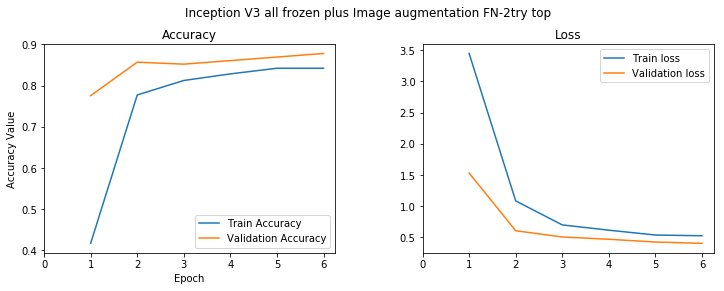

In [13]:
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
t = f.suptitle(
    'Inception V3 all frozen plus Image augmentation FN-2try top', fontsize=12)
f.subplots_adjust(top=0.85, wspace=0.3)

epoch_list = list(range(1, 7))
ax1.plot(
    epoch_list, history.history['acc'], label='Train Accuracy')
ax1.plot(epoch_list,
         history.history['val_acc'], label='Validation Accuracy')
ax1.set_xticks(np.arange(0, 7, 1))
ax1.set_ylabel('Accuracy Value')
ax1.set_xlabel('Epoch')
ax1.set_title('Accuracy')
l1 = ax1.legend(loc="best")

ax2.plot(epoch_list, history.history['loss'], label='Train loss')
ax2.plot(
    epoch_list, history.history['val_loss'], label='Validation loss')
ax2.set_xticks(np.arange(0, 7, 1))
ax2.set_ylabel = ('Loss Value')
ax2.set_xlabel = ('Epoch')
ax2.set_title('Loss')
l2 = ax2.legend(loc="best")

model.save('multiclassDogsBreedsInceptionV3FT2Try-top.h5')

At this point the **top layers** are **trained over 6 epochs** and we can start fine-tuning. We will now **unfreeze** the **top 2 inception V3 convolutional blocks** and train them on the Stanford dogs dataset.

In [4]:
from keras.models import load_model

# loading  te model from disk

model = load_model('multiclassDogsBreedsInceptionV3FT2Try-top.h5')

In the **first try** we had learning rate equal to **0.0001** , in this try we reduced it to **0.000001** 

In [7]:
for layer in model.layers[:249]:
    layer.trainable = False
for layer in model.layers[249:]:
    layer.trainable = True
    
#we now have to re-compile the model so the modifications can take effect 
model.compile(Adam(lr=0.000001), loss='categorical_crossentropy',
              metrics=['accuracy']) # We modified the learning rate because we do not want the weights to adjust abruptly
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            (None, 299, 299, 3)  0                                            
__________________________________________________________________________________________________
conv2d_95 (Conv2D)              (None, 149, 149, 32) 864         input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization_95 (BatchNo (None, 149, 149, 32) 96          conv2d_95[0][0]                  
__________________________________________________________________________________________________
activation_95 (Activation)      (None, 149, 149, 32) 0           batch_normalization_95[0][0]     
__________________________________________________________________________________________________
conv2d_96 

We can see that when all convolutional blocks are frozen there is **1,373,304** trainable parameters, now that we have **unfreeze** 2 convolutional blocks there is **12,488,184** trainable parameters, it will defenetely take longer to re-train the model but we **might get an improvement** if the batch normalization patch works.

Epoch 1/15
190/190 [==============================] - 8500s 45s/step - loss: 0.6394 - acc: 0.8285 - val_loss: 0.4652 - val_acc: 0.8693
Epoch 2/15
190/190 [==============================] - 7984s 42s/step - loss: 0.5943 - acc: 0.8425 - val_loss: 0.4484 - val_acc: 0.8714
Epoch 3/15
190/190 [==============================] - 7961s 42s/step - loss: 0.5632 - acc: 0.8518 - val_loss: 0.4230 - val_acc: 0.8800
Epoch 4/15
190/190 [==============================] - 7957s 42s/step - loss: 0.5475 - acc: 0.8541 - val_loss: 0.4207 - val_acc: 0.8781
Epoch 5/15
190/190 [==============================] - 7955s 42s/step - loss: 0.5327 - acc: 0.8548 - val_loss: 0.4107 - val_acc: 0.8820
Epoch 6/15
190/190 [==============================] - 8118s 43s/step - loss: 0.5258 - acc: 0.8569 - val_loss: 0.4006 - val_acc: 0.8868
Epoch 7/15
190/190 [==============================] - 8147s 43s/step - loss: 0.5146 - acc: 0.8652 - val_loss: 0.3954 - val_acc: 0.8877
Epoch 8/15
190/190 [==============================] - 8

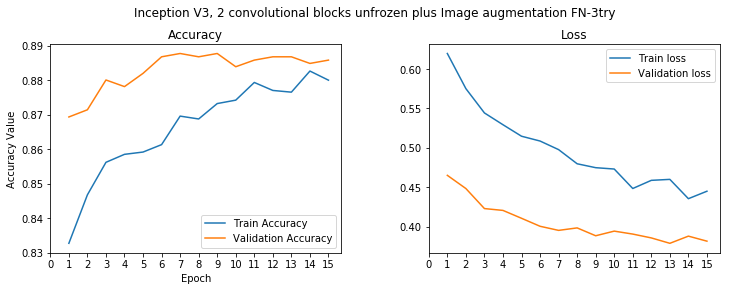

In [8]:
batch_size = BATCH_SIZE
train_steps_per_epoch = x_train.shape[0]//batch_size
val_steps_per_epoch = x_val.shape[0]//batch_size

history = model.fit_generator(train_generator, steps_per_epoch=train_steps_per_epoch, validation_data=val_generator,
                              validation_steps=val_steps_per_epoch, epochs=15, verbose=1)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
t = f.suptitle(
    'Inception V3, 2 convolutional blocks unfrozen plus Image augmentation FN-3try', fontsize=12)
f.subplots_adjust(top=0.85, wspace=0.3)

epoch_list = list(range(1, 16))
ax1.plot(
    epoch_list, history.history['acc'], label='Train Accuracy')
ax1.plot(epoch_list,
         history.history['val_acc'], label='Validation Accuracy')
ax1.set_xticks(np.arange(0, 16, 1))
ax1.set_ylabel('Accuracy Value')
ax1.set_xlabel('Epoch')
ax1.set_title('Accuracy')
l1 = ax1.legend(loc="best")

ax2.plot(epoch_list, history.history['loss'], label='Train loss')
ax2.plot(
    epoch_list, history.history['val_loss'], label='Validation loss')
ax2.set_xticks(np.arange(0, 16, 1))
ax2.set_ylabel = ('Loss Value')
ax2.set_xlabel = ('Epoch')
ax2.set_title('Loss')
l2 = ax2.legend(loc="best")

model.save('multiclassDogsBreedsInceptionV3FN-3try.h5')

It seems this time we **installed correctly** keras with the patch for BN, this time we **did not** get the **bad behavior** in the validation data, the model is **not overfitting** on the training data , however, it seems the model is stock in a **local minima** in the **0.37-0.39** validation loss. We will train **more models** to see if the problem was either the **1st and 2nd hypothesis (batch normalization)** or the **3rd hypothesis (overfitting).**

## Fine-tuning the model 3rd try, Original Learnig rate.  
We will use the **same** learning rate than in the **first try (0.0001)**, we see above that the model could be stock in a local minima and increasing the learning rate could help the model find another minimum, Also by using the **original learnig rate** we will **know** if overfitting was the problem.

In [5]:
from keras.models import load_model

# loading  te model from disk

model = load_model('multiclassDogsBreedsInceptionV3FT2Try-top.h5')

In [6]:
for layer in model.layers[:249]:
    layer.trainable = False
for layer in model.layers[249:]:
    layer.trainable = True
    
#we now have to re-compile the model so the modifications can take effect 
model.compile(Adam(lr=0.0001), loss='categorical_crossentropy',
              metrics=['accuracy']) 
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            (None, 299, 299, 3)  0                                            
__________________________________________________________________________________________________
conv2d_95 (Conv2D)              (None, 149, 149, 32) 864         input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization_95 (BatchNo (None, 149, 149, 32) 96          conv2d_95[0][0]                  
__________________________________________________________________________________________________
activation_95 (Activation)      (None, 149, 149, 32) 0           batch_normalization_95[0][0]     
__________________________________________________________________________________________________
conv2d_96 

Epoch 1/15
190/190 [==============================] - 8144s 43s/step - loss: 0.7392 - acc: 0.7844 - val_loss: 0.5350 - val_acc: 0.8381
Epoch 2/15
190/190 [==============================] - 7998s 42s/step - loss: 0.4455 - acc: 0.8664 - val_loss: 0.5152 - val_acc: 0.8407
Epoch 3/15
190/190 [==============================] - 8224s 43s/step - loss: 0.3130 - acc: 0.9082 - val_loss: 0.5010 - val_acc: 0.8464
Epoch 4/15
190/190 [==============================] - 8161s 43s/step - loss: 0.2243 - acc: 0.9357 - val_loss: 0.6857 - val_acc: 0.8109
Epoch 5/15
190/190 [==============================] - 8404s 44s/step - loss: 0.1979 - acc: 0.9424 - val_loss: 0.5827 - val_acc: 0.8340
Epoch 6/15
190/190 [==============================] - 8100s 43s/step - loss: 0.1441 - acc: 0.9604 - val_loss: 0.6663 - val_acc: 0.8100
Epoch 7/15
190/190 [==============================] - 8005s 42s/step - loss: 0.1224 - acc: 0.9650 - val_loss: 0.5986 - val_acc: 0.8369
Epoch 8/15
190/190 [==============================] - 7

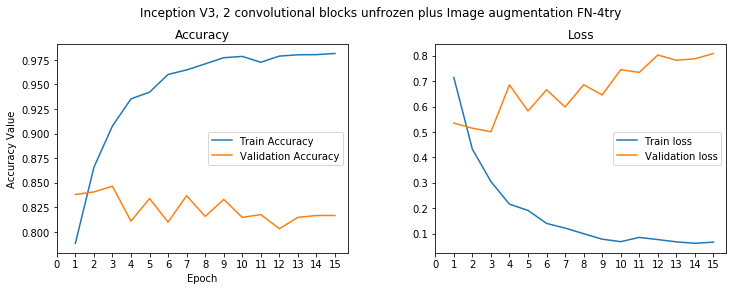

In [7]:
batch_size = BATCH_SIZE
train_steps_per_epoch = x_train.shape[0]//batch_size
val_steps_per_epoch = x_val.shape[0]//batch_size

history = model.fit_generator(train_generator, steps_per_epoch=train_steps_per_epoch, validation_data=val_generator,
                              validation_steps=val_steps_per_epoch, epochs=15, verbose=1)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
t = f.suptitle(
    'Inception V3, 2 convolutional blocks unfrozen plus Image augmentation FN-4try', fontsize=12)
f.subplots_adjust(top=0.85, wspace=0.3)

epoch_list = list(range(1, 16))
ax1.plot(
    epoch_list, history.history['acc'], label='Train Accuracy')
ax1.plot(epoch_list,
         history.history['val_acc'], label='Validation Accuracy')
ax1.set_xticks(np.arange(0, 16, 1))
ax1.set_ylabel('Accuracy Value')
ax1.set_xlabel('Epoch')
ax1.set_title('Accuracy')
l1 = ax1.legend(loc="best")

ax2.plot(epoch_list, history.history['loss'], label='Train loss')
ax2.plot(
    epoch_list, history.history['val_loss'], label='Validation loss')
ax2.set_xticks(np.arange(0, 16, 1))
ax2.set_ylabel = ('Loss Value')
ax2.set_xlabel = ('Epoch')
ax2.set_title('Loss')
l2 = ax2.legend(loc="best")

model.save('multiclassDogsBreedsInceptionV3FN-4try.h5')

Once **again** we are seeing the **bad behaviour** on the validation set and the **overfitting** on the training data. After all we were **actually overfitting** the model.

### Was overfitting the only problem?

Let's now **find out** if the model is **being affected** by  batch normalization, i.e. I did not installed correctly the BN patch the first time. In order to find out we will use the **same data** in **training mode** and **inference mode**, we have already try the **train_generator** in the above model, getting a **97-98** accuracy in **training mode**, so now we will **evaluate** the same dataset but in **inference mode.**

In [8]:
model.evaluate_generator(train_generator, steps=None, max_queue_size=10, workers=1, use_multiprocessing=False, verbose=1)

191/191 [==============================] - 6524s 34s/step


[0.06951090601030821, 0.9782930439072521]

This time we **did not get** the **differences** between **training mode and inference mode** in the same data, so we can say that I did **not correctly installed** the BN patch the first time, but I did it **right the 2nd time.**

## Fine-tuning the model 4th try, Another Learnig rate.

This time we will use **0.00001** as learning rate to see if we can get better results on the validation set without overfitting the model on the training data.

In [4]:
BATCH_SIZE = 32

# create train generator

train_datagen = ImageDataGenerator(rescale=1./255, rotation_range=30,
                                   width_shift_range=0.2, height_shift_range=0.2, horizontal_flip=True)

train_generator = train_datagen.flow(
    x_train, y_train_dummies, shuffle=False, batch_size=BATCH_SIZE) #removed seed=1

# create validation generator

val_datagen = ImageDataGenerator(rescale=1./255)
val_generator = val_datagen.flow(x_val, y_val_dummies, shuffle=False, batch_size=BATCH_SIZE) #removed seed=1

In [5]:
from keras.models import load_model

# loading  te model from disk

model = load_model('multiclassDogsBreedsInceptionV3FT2Try-top.h5')

In [6]:
for layer in model.layers[:249]:
    layer.trainable = False
for layer in model.layers[249:]:
    layer.trainable = True
    
#we now have to re-compile the model so the modifications can take effect 
model.compile(Adam(lr=0.00001), loss='categorical_crossentropy',
              metrics=['accuracy']) 
model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            (None, 299, 299, 3)  0                                            
__________________________________________________________________________________________________
conv2d_95 (Conv2D)              (None, 149, 149, 32) 864         input_2[0][0]                    
__________________________________________________________________________________________________
batch_normalization_95 (BatchNo (None, 149, 149, 32) 96          conv2d_95[0][0]                  
__________________________________________________________________________________________________
activation_95 (Activation)      (None, 149, 149, 32) 0           batch_normalization_95[0][0]     
__________________________________________________________________________________________________
conv2d_96 

In [ ]:
batch_size = BATCH_SIZE
train_steps_per_epoch = x_train.shape[0]//batch_size
val_steps_per_epoch = x_val.shape[0]//batch_size

history = model.fit_generator(train_generator, steps_per_epoch=train_steps_per_epoch, validation_data=val_generator,
                              validation_steps=val_steps_per_epoch, epochs=15, verbose=1)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
t = f.suptitle(
    'Inception V3, 2 convolutional blocks unfrozen plus Image augmentation FN-5try', fontsize=12)
f.subplots_adjust(top=0.85, wspace=0.3)

epoch_list = list(range(1, 16))
ax1.plot(
    epoch_list, history.history['acc'], label='Train Accuracy')
ax1.plot(epoch_list,
         history.history['val_acc'], label='Validation Accuracy')
ax1.set_xticks(np.arange(0, 16, 1))
ax1.set_ylabel('Accuracy Value')
ax1.set_xlabel('Epoch')
ax1.set_title('Accuracy')
l1 = ax1.legend(loc="best")

ax2.plot(epoch_list, history.history['loss'], label='Train loss')
ax2.plot(
    epoch_list, history.history['val_loss'], label='Validation loss')
ax2.set_xticks(np.arange(0, 16, 1))
ax2.set_ylabel = ('Loss Value')
ax2.set_xlabel = ('Epoch')
ax2.set_title('Loss')
l2 = ax2.legend(loc="best")

model.save('multiclassDogsBreedsInceptionV3FN-5try.h5')

Epoch 1/15
190/190 [==============================] - 8072s 42s/step - loss: 0.5726 - acc: 0.8441 - val_loss: 0.3957 - val_acc: 0.8807
Epoch 2/15
190/190 [==============================] - 8281s 44s/step - loss: 0.4948 - acc: 0.8666 - val_loss: 0.3862 - val_acc: 0.8839
Epoch 3/15
190/190 [==============================] - 8137s 43s/step - loss: 0.4361 - acc: 0.8816 - val_loss: 0.3711 - val_acc: 0.8839
Epoch 4/15
190/190 [==============================] - 7952s 42s/step - loss: 0.3884 - acc: 0.8956 - val_loss: 0.3751 - val_acc: 0.8800
Epoch 5/15
190/190 [==============================] - 7953s 42s/step - loss: 0.3544 - acc: 0.9112 - val_loss: 0.3731 - val_acc: 0.8877
Epoch 6/15
190/190 [==============================] - 7984s 42s/step - loss: 0.3166 - acc: 0.9186 - val_loss: 0.3624 - val_acc: 0.8848
Epoch 7/15
190/190 [==============================] - 7954s 42s/step - loss: 0.2997 - acc: 0.9240 - val_loss: 0.3596 - val_acc: 0.8877
Epoch 8/15
190/190 [==============================] - 7

With this learning rate we can see that the model does not overfit so fast on the training data, however, even though we are getting improvement on the loss for the training data, we do not see any improvements beyond 0.35-0.36 on the validation data. We might be at the global minima for this amount of images per class.